## HTO Endometrium organoids processing - combining with in vivo dataset & subsetting

Processing & combining data organoids

In [ ]:
import sys
sys.path.append("../code")
from code.data_prep.io import *
from code.data_prep.processing import *
from code.plotting.plot_settings import *
from code.plotting.palette import *

In [1]:
import scanpy as sc
from pathlib import Path
import numpy as np
import pandas as pd
import scrublet as scr

import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline
sc.settings.verbosity=3

In [3]:
main_dir = "/projects/robson-lab/research/endometriosis/"
organoid_dir = "data/h5ad/organoids/"
sample_id = "Endometriosis-revision-3"

sc.settings.figdir = f"{main_dir}figures/{sample_id}"
matplotlib.rcParams["figure.facecolor"]="white"

---

Load dataset from all organoids

In [6]:
# Load previously combined organoids dataset
org = sc.read(f"{main_dir}/{organoid_dir}/organoids-combined-final-v2-20211112.h5ad")

load & subset dataset from endometrial tissue

In [7]:
final_cluster = sc.read(f"{main_dir}data/h5ad/{sample_id}/{sample_id}-scrubs-clean-final-20220103.h5ad")

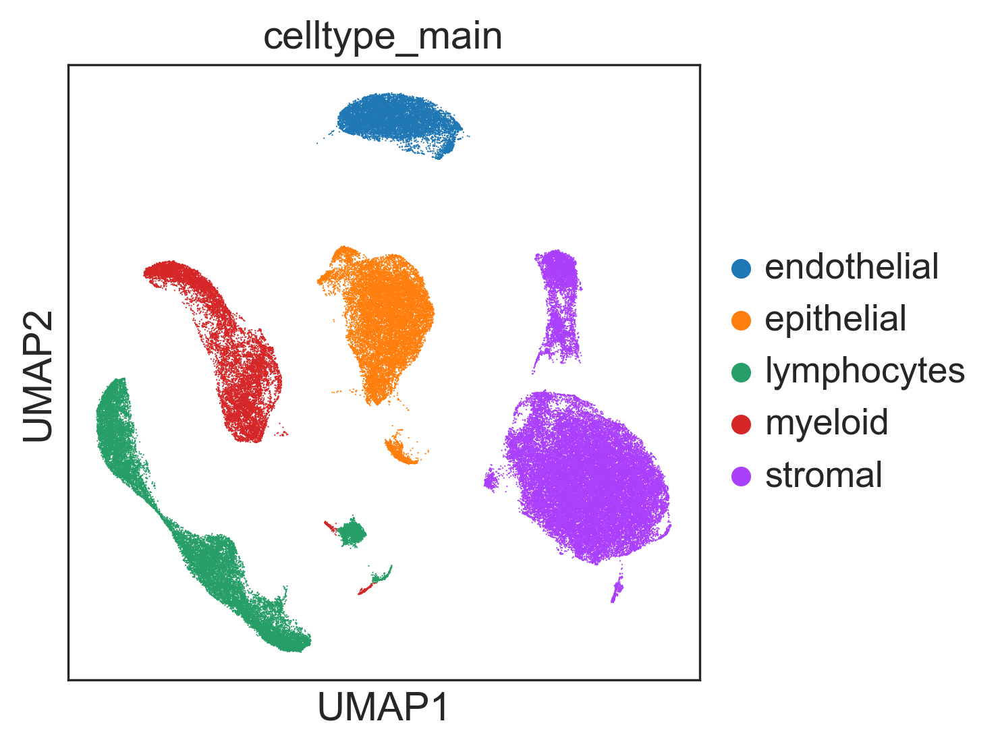

In [8]:
sc.pl.umap(final_cluster, color=["celltype_main"])

In [82]:
sub_dir = "non_immune"
non_immune = ["stromal","epithelial"]
adata = final_cluster[final_cluster.obs.celltype_main.isin(non_immune)]

#tidying
adata.obs["chemistry"] = adata.obs["10x_chemistry"]
adata.obs.drop(["10x_chemistry","library","visible_doublet"], axis=1, inplace=True)
adata.obs["species"]= "human"
adata.obs["source"]= "tissue"
adata.obs["method"]= "fresh tissue"

adata.uns["sampleid"] = sample_id
adata.uns["output_dir"] = f"{main_dir}data/h5ad/{sample_id}/"

Trying to set attribute `.obs` of view, copying.


In [10]:
combined = org_final.concatenate(adata)

/opt/conda/lib/python3.7/site-packages/anndata/_core/merge.py:461: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  obs = pd.concat([a.obs for a in adatas], ignore_index=True)
/opt/conda/lib/python3.7/site-packages/anndata/_core/merge.py:513: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  UserWarning,


In [11]:
bool_map = {"True": True, "False": False, "nan": False, True: True, False: False}
bool_func = lambda x: x.map(bool_map)

In [12]:
combined.var["mitochondrial"] = np.logical_or.reduce(
    combined.var.loc[:, combined.var.columns.str.startswith("mito")].apply(bool_func, axis=1).values, 
    axis=1
)
combined.var["hemoglobin"] = np.logical_or.reduce(
    combined.var.loc[:, combined.var.columns.str.startswith("hemo")].apply(bool_func, axis=1).values, 
    axis=1
)

combined.var["ribosomal"] = combined.var_names.str.startswith("RPL") |\
                            combined.var_names.str.startswith("RPS") |\
                            combined.var_names.str.startswith("MRPL") |\
                            combined.var_names.str.startswith("MRPS")

In [13]:
combined.uns["sampleid"] = sample_id
combined.uns["output_dir"] = f"{main_dir}data/h5ad/{sample_id}/"

In [14]:
save_adata(combined,"combined-raw",subdir=sub_dir)

... storing 'Patient_id' as categorical
... storing 'celltype' as categorical
... storing 'celltype_main' as categorical
... storing 'chemistry' as categorical
... storing 'cluster' as categorical
... storing 'cluster_R1' as categorical
... storing 'hto' as categorical
... storing 'leiden' as categorical
... storing 'leiden_R1' as categorical
... storing 'leiden_R2' as categorical
... storing 'leiden_R3' as categorical
... storing 'leiden_R4' as categorical
... storing 'leiden_R5' as categorical
... storing 'leiden_R6' as categorical
... storing 'leiden_R7' as categorical
... storing 'method' as categorical
... storing 'original_barcode' as categorical
... storing 'sample_name' as categorical
... storing 'sample_type' as categorical
... storing 'sampleid' as categorical
... storing 'singlet_short' as categorical
... storing 'singlets' as categorical
... storing 'source' as categorical
... storing 'species' as categorical
... storing 'stage' as categorical


In [15]:
combined

AnnData object with n_obs × n_vars = 77467 × 26636
    obs: 'Patient_id', 'celltype', 'celltype_main', 'chemistry', 'cluster', 'cluster_R1', 'hto', 'leiden', 'leiden_R1', 'leiden_R2', 'leiden_R3', 'leiden_R4', 'leiden_R5', 'leiden_R6', 'leiden_R7', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_hemoglobin', 'log1p_total_counts_mitochondrial', 'method', 'n_genes_by_counts', 'original_barcode', 'pct_counts_hemoglobin', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mitochondrial', 'pct_counts_ribosomal', 'sample_name', 'sample_type', 'sampleid', 'scrublet_predicted_doublet', 'scrublet_score', 'sequencing_saturation', 'singlet_short', 'singlets', 'source', 'species', 'stage', 'total_counts', 'total_counts_hemoglobin', 'total_counts_mitochondrial', 'total_counts_ribosomal', 'batch'
    var: 'gene_ids', 'mitochondrial', 'cell_cycle', 'stress_response', 'feature_types-0', 'genome-0',

In [17]:
full = preprocess(combined, n_top_genes=1000)

filtered out 651 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:01)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [18]:
print (full.layers["raw"].max())
print (full.layers["normed"].max())
print (full.X.max())

46348.0
7968.662
8.9833975


In [29]:
save_adata(full,"combined-normed",subdir=sub_dir)

In [67]:
full = sc.read(f"{main_dir}/data/h5ad/{sample_id}/non_immune/{sample_id}-combined-normed-20220105.h5ad")
full

AnnData object with n_obs × n_vars = 77467 × 25985
    obs: 'Patient_id', 'celltype', 'celltype_main', 'chemistry', 'cluster', 'cluster_R1', 'hto', 'leiden', 'leiden_R1', 'leiden_R2', 'leiden_R3', 'leiden_R4', 'leiden_R5', 'leiden_R6', 'leiden_R7', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_hemoglobin', 'log1p_total_counts_mitochondrial', 'method', 'n_genes_by_counts', 'original_barcode', 'pct_counts_hemoglobin', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mitochondrial', 'pct_counts_ribosomal', 'sample_name', 'sample_type', 'sampleid', 'scrublet_predicted_doublet', 'scrublet_score', 'sequencing_saturation', 'singlet_short', 'singlets', 'source', 'species', 'stage', 'total_counts', 'total_counts_hemoglobin', 'total_counts_mitochondrial', 'total_counts_ribosomal', 'batch'
    var: 'gene_ids', 'mitochondrial', 'cell_cycle', 'stress_response', 'feature_types-0', 'genome-0',

### Batch Correction

In [68]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [69]:
sc.pp.pca(full, svd_solver="arpack",use_highly_variable=True)

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:07)


In [70]:
pcs = full.obsm["X_pca"]
metadata = full.obs
covariates = ["Patient_id"]
thetas = np.array([1.5])

In [71]:
%%R -i pcs -i covariates -i thetas -i metadata -o pcs_harmony
library(harmony)
pcs_harmony <- HarmonyMatrix(
    pcs,
    metadata,
    vars_use=covariates,
    theta=thetas,
    do_pca=FALSE
)

R[write to console]: Harmony 1/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write t

In [73]:
harmonized = load_pcs(full, pcs_harmony)

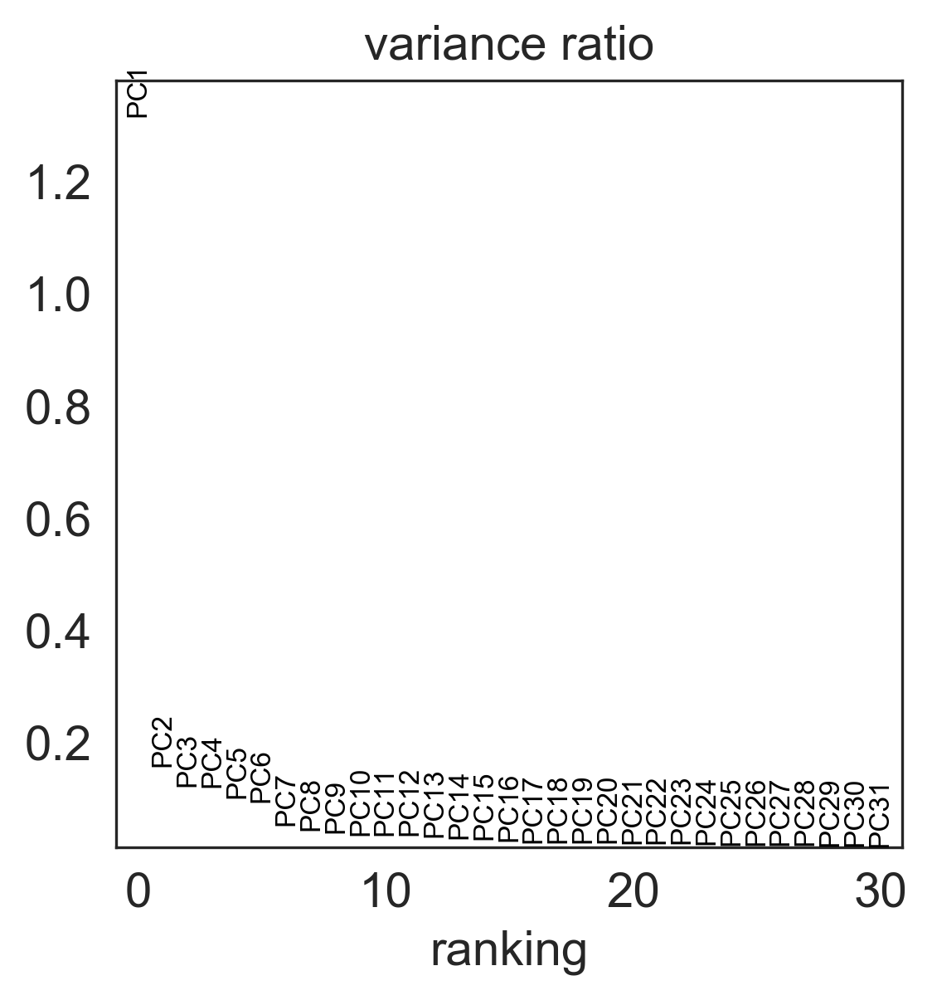

In [74]:
sc.pl.pca_variance_ratio(harmonized,show=False)

In [75]:
sc.pp.neighbors(harmonized, n_neighbors=25, n_pcs=10, metric="correlation")
sc.tl.umap(harmonized, min_dist=0.1)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:32)
computing UMAP


/opt/conda/lib/python3.7/site-packages/scanpy/neighbors/__init__.py:121: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = neighbors.distances
/opt/conda/lib/python3.7/site-packages/scanpy/neighbors/__init__.py:122: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = neighbors.connectivities
/opt/conda/lib/python3.7/site-packages/scanpy/tools/_umap.py:147: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'].tocoo(),


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:04)


In [ ]:
sc.pl.umap(harmonized, color=["source","method","sample_type","EPCAM"],
           ncols=2,wspace=0.25,use_raw=False,color_map="Reds")

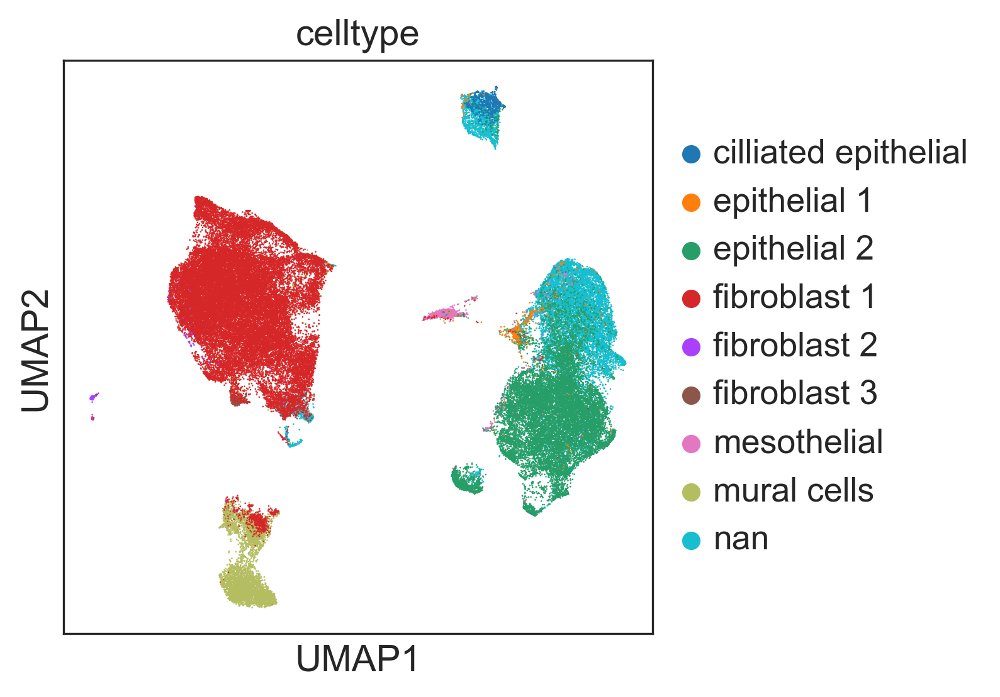

In [77]:
sc.pl.umap(harmonized, color=["celltype"])

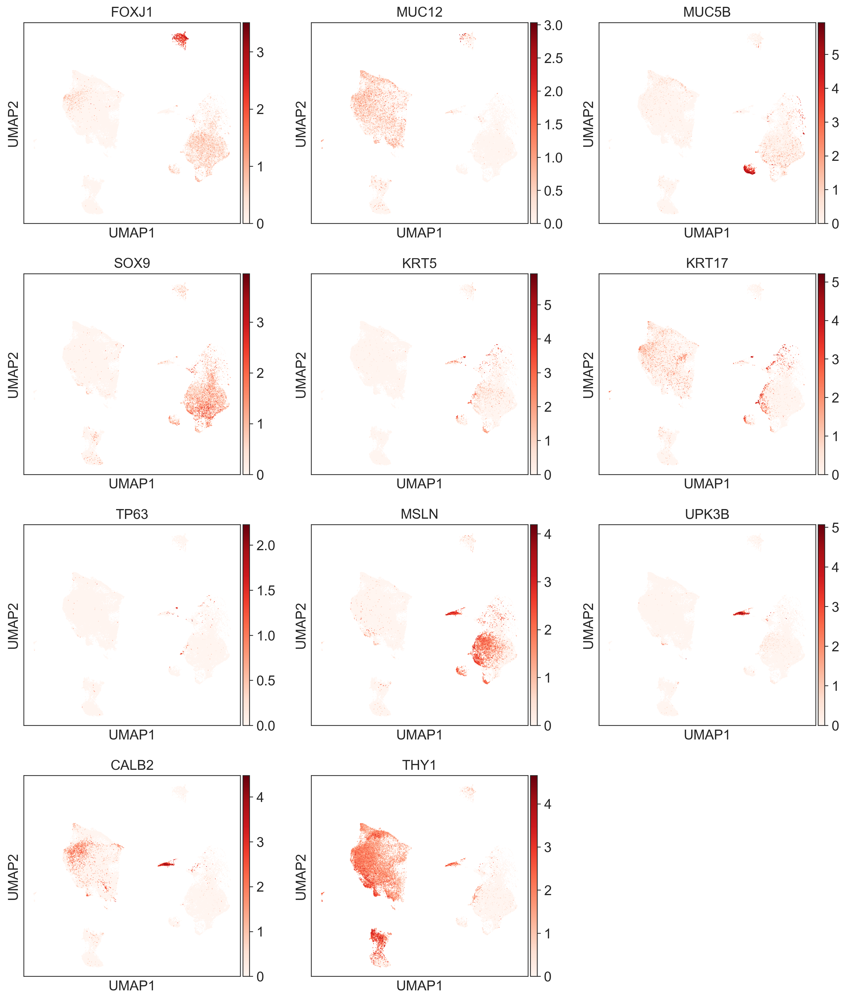

In [78]:
sc.pl.umap(harmonized[harmonized.obs.source == "tissue"], color= ["FOXJ1","MUC12","MUC5B","SOX9","KRT5","KRT17","TP63","MSLN","UPK3B","CALB2","THY1"],
           ncols=3,cmap="Reds")

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


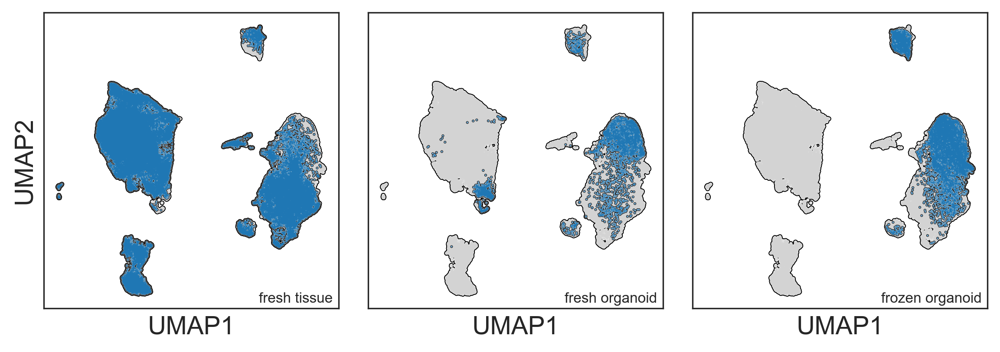

In [79]:
#how's the cells distribution looks like?
fig = plt.figure(figsize=(9.3, 3), facecolor="white")
gs = plt.GridSpec(1, 3,wspace=0.1)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
axs = [ax1,ax2,ax3]

main_cluster = harmonized.copy()
params = dict(show=False, title="", add_outline=True, legend_loc=None)
biopsy_origins = "fresh tissue","fresh organoid","frozen organoid"
number_of_cells = "0 cells","0 cells","0 cells"
#sample_type_palette=[get_xkcd[6],get_xkcd[5],get_xkcd[4]]

for k in range(len(axs)):
    ax = axs[k]
    sc.pl.umap(
        main_cluster, s=10, 
        ax=ax,
        **params
    ) 
    biopsys = biopsy_origins[k]
    n_cells = number_of_cells[k]
    sc.pl.umap(
        main_cluster[main_cluster.obs.method.isin([biopsys])], s=3,
        color="method",
        #palette=[sample_type_palette[k]],
        ax=ax,
        **params
    )
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.text(0.98, 0.02, biopsys, transform=ax.transAxes, ha="right", fontsize=8)
    #ax.text(0.98, 0.94, n_cells, transform=ax.transAxes, ha="right", fontsize=8)
ax1.set_ylabel("UMAP2",)
ax1.set_xlabel("UMAP1")
ax2.set_xlabel("UMAP1")
ax3.set_xlabel("UMAP1")
fig.tight_layout(rect=(0.025, 0.025, 0.95, 0.95))
#fig.savefig("u01_umap.png", bbox_inches="tight", dpi=300)
#save_figure(fig, pdir="Fig_1", name="sample_type")

running Leiden clustering


/opt/conda/lib/python3.7/site-packages/scanpy/tools/_leiden.py:111: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adjacency = adata.uns['neighbors']['connectivities']


    finished: found 8 clusters and added
    'leiden_org', the cluster labels (adata.obs, categorical) (0:01:33)


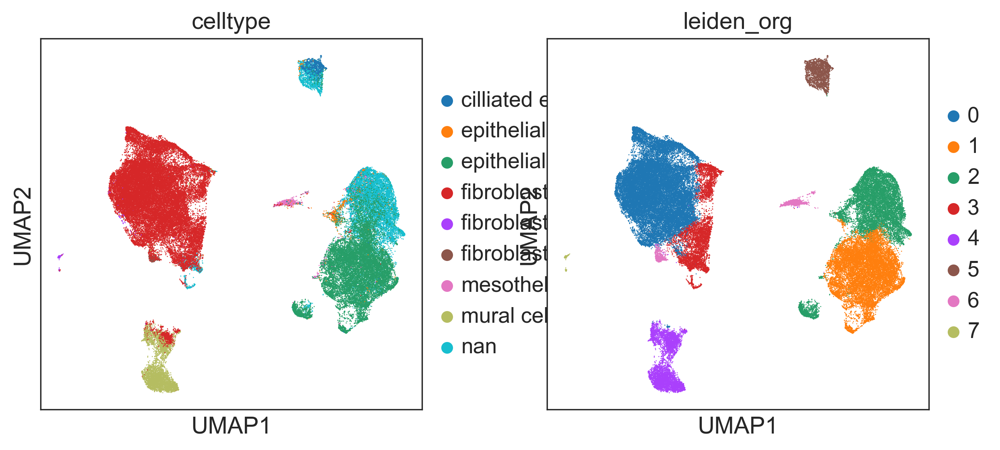

In [80]:
sc.tl.leiden(harmonized, resolution=0.2, key_added="leiden_org")
sc.pl.umap(harmonized, 
           color=["celltype","leiden_org"],
           use_raw=False,
          )

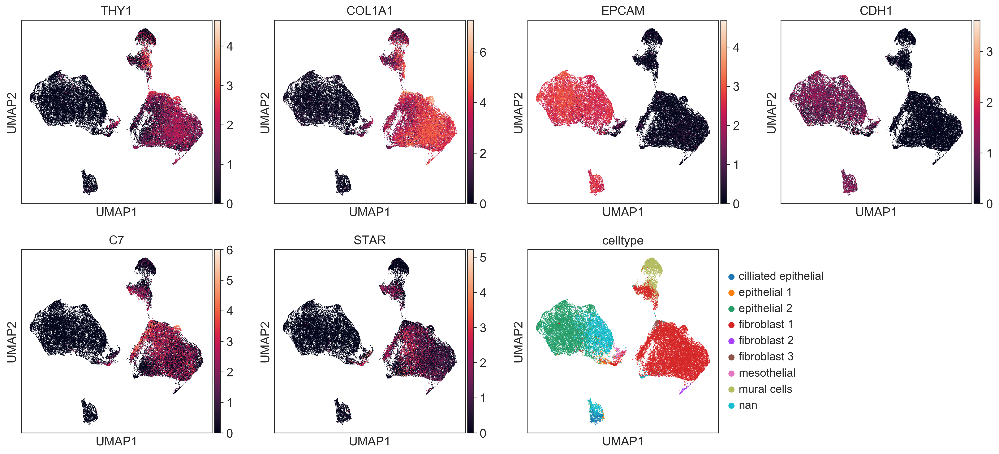

In [48]:
sc.pl.umap(harmonized, color=["THY1","COL1A1","EPCAM","CDH1","C7","STAR","celltype"])

In [81]:
save_adata(harmonized,"combined-harmonized-final",subdir="non_immune")

---

### Subclusters

In [83]:
epi = ["1","2","5","6"]
stro = ["0","3","4"]
excluded = ["7"]
sub_dir = "non_immune"

lists = [epi, stro]
subcluster_name = ["epi", "stro"]

for x,z in zip(lists, subcluster_name): 
    subclust = harmonized[harmonized.obs.leiden_org.isin(x)]
    
    subclust.uns["sampleid"] = sample_id
    subclust.uns["output_dir"] = f"{main_dir}data/h5ad/{sample_id}/"
    
    sc.pp.filter_genes(subclust, min_cells=3)
    
    full = preprocess(subclust, n_top_genes=1000)
    sc.pp.pca(full, svd_solver="arpack",use_highly_variable=True)
    save_adata(full, f"{z}", subdir = sub_dir)

Trying to set attribute `.uns` of view, copying.


filtered out 1115 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:01)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:03)


Trying to set attribute `.uns` of view, copying.


filtered out 1544 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:03)


In [84]:
##Let's include only cells analyzed in L1 epithelial clustering minus mesothelial cluster.
#re-load
sub_dir = "non_immune"
epi_adata = sc.read(f"{main_dir}data/h5ad/{sample_id}/{sub_dir}/{sample_id}-epi-20220105.h5ad") #tissue + organoid
#stro_adata = sc.read(f"{main_dir}data/h5ad/{sample_id}/{sub_dir}/{sample_id}-stro-20220105.h5ad")

sub_dir = "Epithelial"
epi = sc.read(f"{main_dir}/data/h5ad/{sample_id}/{sub_dir}/{sample_id}-final-Epi-20220104.h5ad") #tissue only
subset = epi[epi.obs.subtypes != "mesothelial"].copy() 
subset.obs_names = subset.obs_names+"-1"

In [85]:
##Latest epithelial clustering minus mesothelial cluster.
#re-load
sub_dir = "non_immune"
epi_adata = sc.read(f"{main_dir}data/h5ad/{sample_id}/{sub_dir}/{sample_id}-epi-20220121.h5ad") #tissue + organoid
#stro_adata = sc.read(f"{main_dir}data/h5ad/{sample_id}/{sub_dir}/{sample_id}-stro-20220105.h5ad")

sub_dir = "Epithelial"
epi = sc.read(f"{main_dir}/data/h5ad/{sample_id}/{sub_dir}/{sample_id}-final-Epi-20220119.h5ad") #tissue only
subset = epi[epi.obs.subtypes != "mesothelial"].copy() 
subset.obs_names = subset.obs_names+"-1"

In [86]:
len(epi_adata.obs_names.intersection(subset.obs_names))

17872

In [87]:
sub_dir = "non_immune"
to_keep = epi_adata.obs_names.intersection(subset.obs_names)
epi_2 = epi_adata[epi_adata.obs_names.isin(to_keep)].copy()


epi_2.uns["sampleid"] = sample_id
epi_2.uns["output_dir"] = f"{main_dir}data/h5ad/{sample_id}/"

sc.pp.filter_genes(epi_2, min_cells=3)

full = preprocess(epi_2, n_top_genes=1000)
save_adata(full, "Epi-org", subdir = sub_dir)

filtered out 887 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


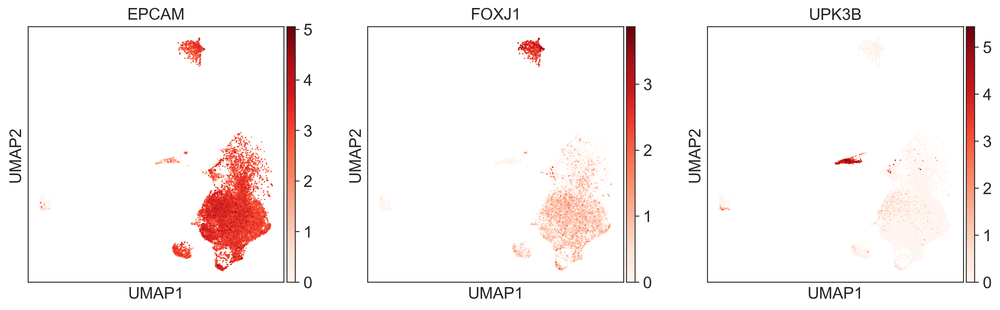

In [88]:
sc.pl.umap(epi_adata[epi_adata.obs.source == "tissue"], color = ["EPCAM","FOXJ1","UPK3B"], color_map = "Reds")

---
### Let's work on Epithelial dataset
1. how's cells distributed? is it similar to epithelial in tissue?

**Batch Correction**

In [89]:
%reload_ext rpy2.ipython

In [90]:
full = epi_adata[epi_adata.obs.celltype_main != "stromal"].copy() 
sc.pp.pca(full, svd_solver="arpack",use_highly_variable=True)

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:03)


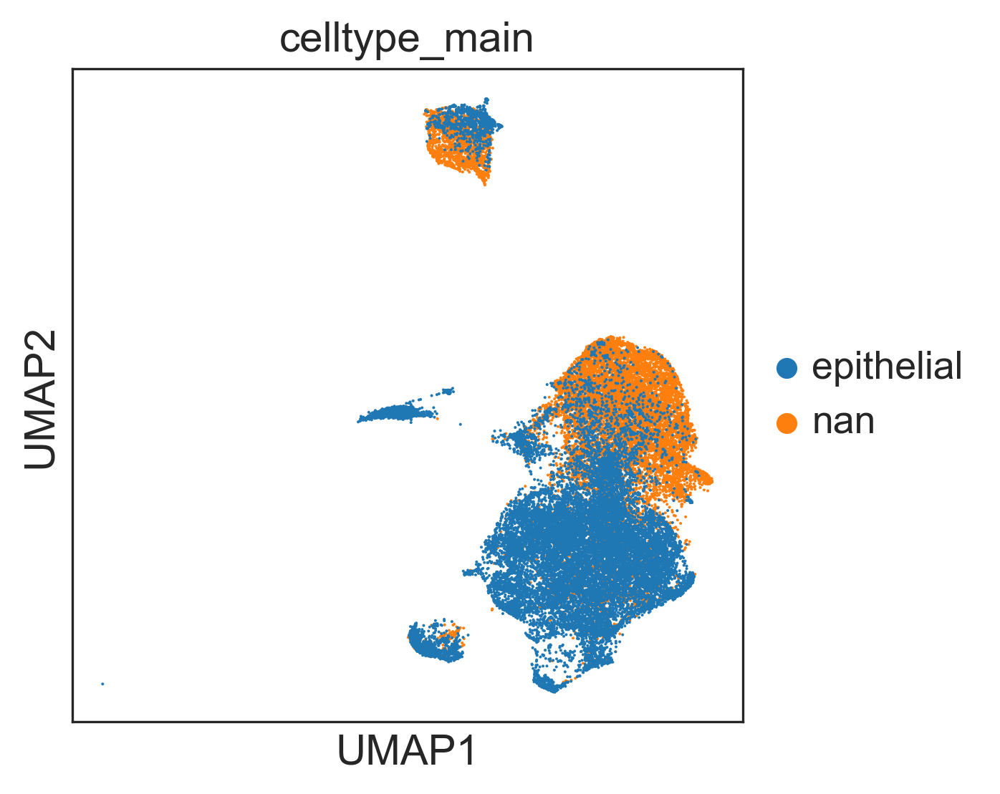

In [91]:
sc.pl.umap(full, color = ["celltype_main"])

In [106]:
pcs = full.obsm["X_pca"]
metadata = full.obs
covariates = ["Patient_id"]
thetas = np.array([1.5])

In [107]:
%%R -i pcs -i covariates -i thetas -i metadata -o pcs_harmony
library(harmony)
pcs_harmony <- HarmonyMatrix(
    pcs,
    metadata,
    vars_use=covariates,
    theta=thetas,
    do_pca=FALSE
)

R[write to console]: Harmony 1/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write t

In [124]:
harmonized = load_pcs(full, pcs_harmony)

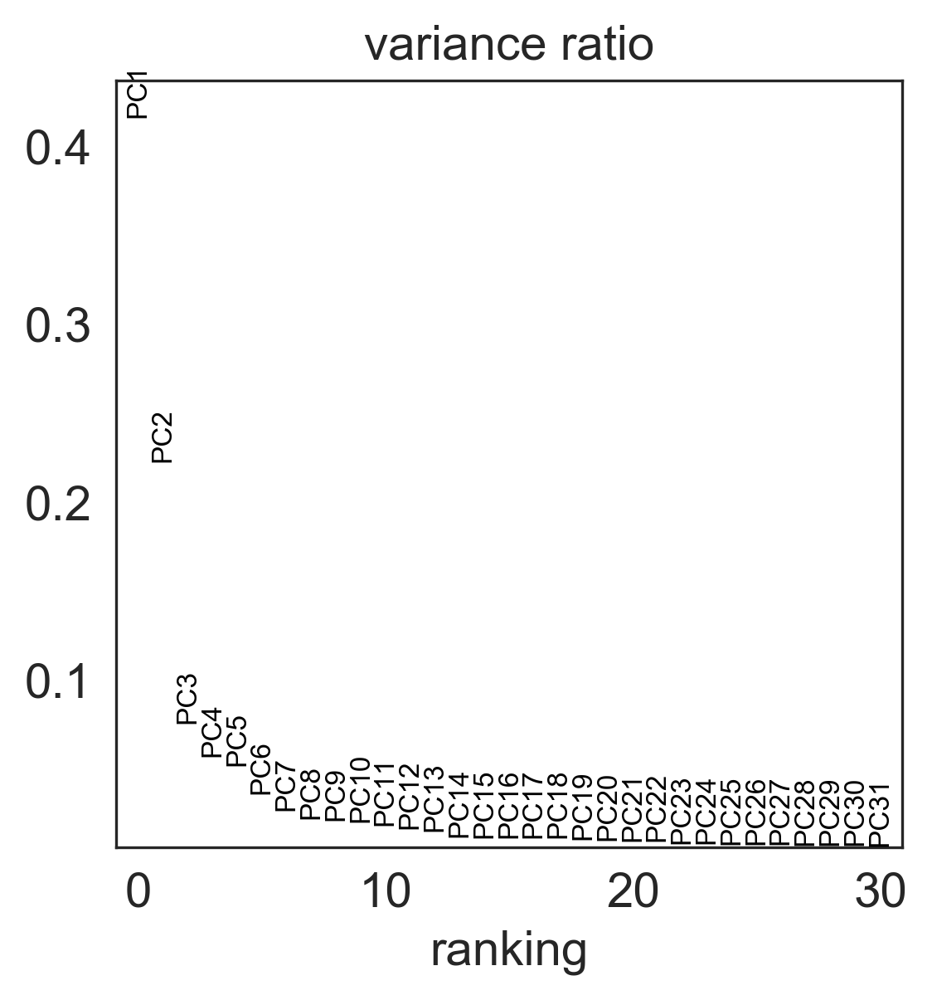

In [125]:
sc.pl.pca_variance_ratio(harmonized,show=False)

In [126]:
sc.pp.neighbors(harmonized, n_neighbors=25, n_pcs=10, metric="correlation")
sc.tl.umap(harmonized, min_dist=0.05)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:10)
computing UMAP


/opt/conda/lib/python3.7/site-packages/scanpy/neighbors/__init__.py:121: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = neighbors.distances
/opt/conda/lib/python3.7/site-packages/scanpy/neighbors/__init__.py:122: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = neighbors.connectivities
/opt/conda/lib/python3.7/site-packages/scanpy/tools/_umap.py:147: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'].tocoo(),


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)


In [ ]:
sc.pl.umap(harmonized, color=["source","method","sample_type","EPCAM",],alpha_img=0.5,
           ncols=2,wspace=0.25,use_raw=False,color_map="Reds")

In [128]:
#tidy up the barcodes
##load previous adata
anno = epi

##create new obs_names
barcodes = harmonized.obs_names.str.split("-",expand=True).to_frame().reset_index(drop=True)
mask = harmonized.obs.source == "tissue"
barcodes.loc[~mask.values,2] = (barcodes.loc[~mask.values,2].astype(int)+31).astype(str)
new_obs_names = barcodes[0]+"-"+barcodes[1]+"-"+barcodes[2]

#save as obs
harmonized.obs["new_barcodes"] = new_obs_names.values
harmonized.obs["old_barcodes"] = harmonized.obs_names

#assign new obs_names & map subtypes
harmonized.obs_names = harmonized.obs["new_barcodes"]
harmonized.obs["subtypes"] = anno.obs["subtypes"].reindex(harmonized.obs_names).astype(str)

#remove "new_barcodes" from obs
harmonized.obs.drop("new_barcodes", inplace=True, axis=1)

... storing 'subtypes' as categorical


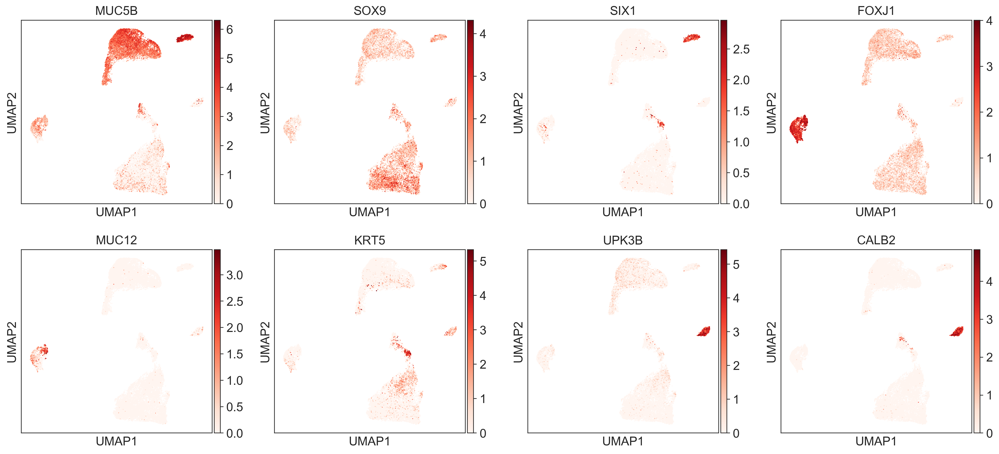

In [129]:
sc.pl.umap(harmonized, 
           color = ["MUC5B","SOX9","SIX1","FOXJ1","MUC12","KRT5","UPK3B","CALB2"],
           color_map="Reds")

running Leiden clustering


/opt/conda/lib/python3.7/site-packages/scanpy/tools/_leiden.py:111: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adjacency = adata.uns['neighbors']['connectivities']


    finished: found 10 clusters and added
    'leiden_org_epi', the cluster labels (adata.obs, categorical) (0:00:26)


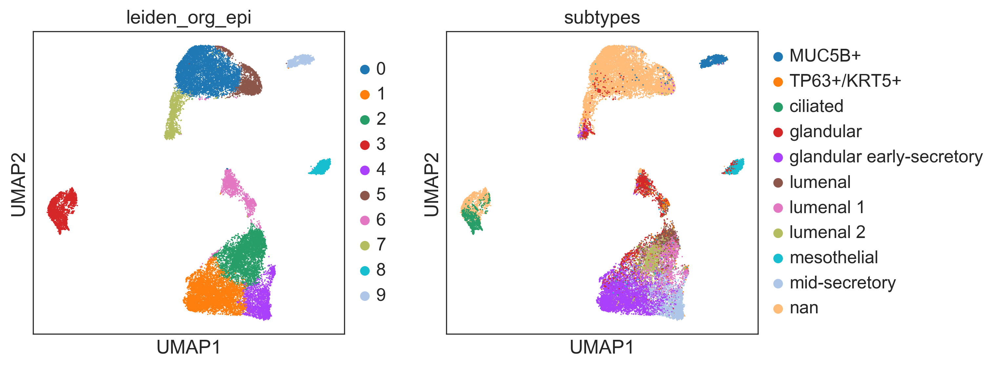

In [130]:
sc.tl.leiden(harmonized, resolution=0.4, key_added="leiden_org_epi")
sc.pl.umap(harmonized, 
           color=["leiden_org_epi","subtypes"],
           use_raw=False,
          )

In [137]:
harmonized.obs["subtypes"] = harmonized.obs.subtypes.map({
    "ciliated":"ciliated",
    "mid-secretory":"mid-secretory", 
    "lumenal":"lumenal",
    "lumenal 1":"lumenal 1",
    "lumenal 2":"lumenal 2",
    "TP63+/KRT5+":"TP63+/KRT5+", 
    "glandular":"glandular", 
    "glandular early-secretory":"glandular early-secretory",
    "MUC5B+":"MUC5B+",
    "mesothelial":"mesothelial",
    "nan":"EEO"
}).astype("category")

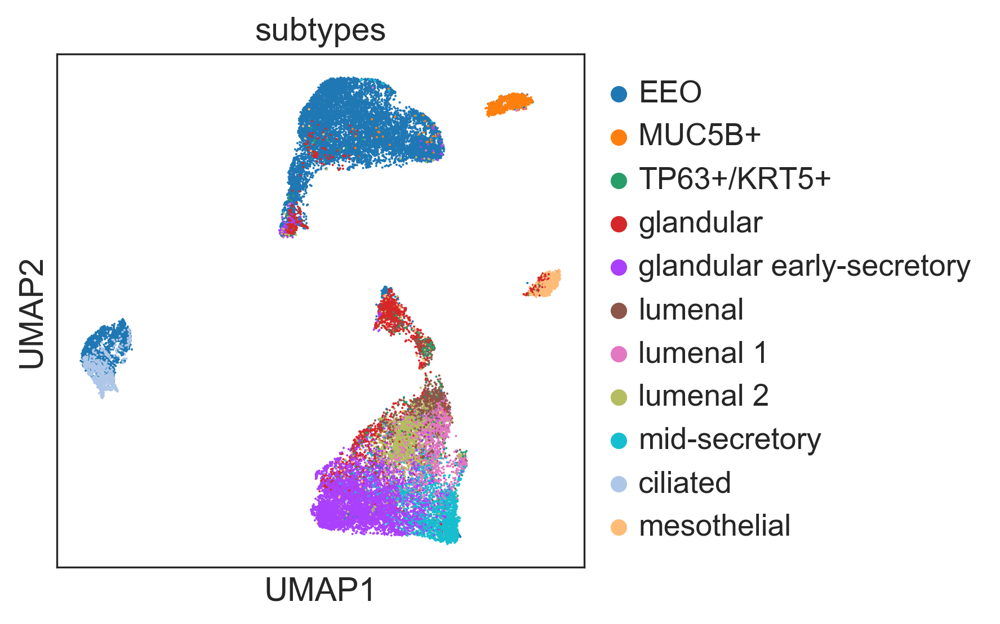

In [138]:
harmonized.obs["subtypes"].cat.reorder_categories([
    "EEO","MUC5B+","TP63+/KRT5+","glandular", "glandular early-secretory",
    "lumenal","lumenal 1","lumenal 2","mid-secretory","ciliated","mesothelial"
],
    inplace=True)

sc.pl.umap(harmonized, color=["subtypes"])

In [139]:
save_adata(harmonized, "epi-harmonized", subdir = sub_dir)

---